In [13]:
import warnings
from numba.core.errors import NumbaWarning
warnings.filterwarnings("ignore", category=NumbaWarning)

In [14]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf
import seaborn as sns

from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score
from sklearn.metrics import f1_score, confusion_matrix, precision_recall_curve, roc_curve
from sklearn.metrics import ConfusionMatrixDisplay

from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, losses
from tensorflow.keras.datasets import fashion_mnist
from tensorflow.keras.models import Model

import umap
import umap.plot

from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [15]:
from numba import jit

@jit
def my_func(x):
    return x + 1

# Avoid re-calling @jit if unnecessary
result1 = my_func(10)
result2 = my_func(20)

In [16]:
def get_clf_eval(y_test, pred=None, pred_proba=None):
    confusion = confusion_matrix( y_test, pred)
    accuracy = accuracy_score(y_test , pred)
    precision = precision_score(y_test , pred)
    recall = recall_score(y_test , pred)
    f1 = f1_score(y_test,pred)   
     
    roc_auc = roc_auc_score(y_test, pred_proba)
    print('confusion matrix')
    print(confusion)

    # ROC-AUC print 
    print('accuracy: {0:.4f}, precision: {1:.4f}, recall: {2:.4f},\
    F1: {3:.4f}, AUC:{4:.4f}'.format(accuracy, precision, recall, f1, roc_auc))
    return confusion

In [17]:
dataframe = pd.read_csv('shuffled_Oscillation (5).csv', header=None)
raw_data = dataframe.values
dataframe.head().style.set_properties(**{'background-color': 'black',
                           'color': 'white',
                           'border-color': 'white'})

In [18]:
import plotly.graph_objects as go

# Define target labels and colors
colors = ['gold', 'mediumturquoise']  # Colors for pie chart sections
labels = ['Oscillation (Normal)', 'Other (Abnormal)']  # Updated labels for your dataset

# Calculate distribution of target values
target_column = dataframe.iloc[:, -1]  # Target column is the last column
values = target_column.value_counts(normalize=True)  # Proportions of each class

# Plot the pie chart
fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.3)])
fig.update_traces(
    hoverinfo='label+percent',
    textinfo='percent',
    textfont_size=20,
    marker=dict(colors=colors, line=dict(color='white', width=0.1))
)
fig.update_layout(
    title_text="THz Dataset",
    title_font_color="white",
    legend_title_font_color="yellow",
    paper_bgcolor="black",
    plot_bgcolor='black',
    font_color="white",
)
fig.show()


In [19]:
labels = raw_data[:, -1]  # Last column as labels
data = raw_data[:, :-1]   # All other columns as features

# Split the dataset into training and testing sets
train_data, test_data, train_labels, test_labels = train_test_split(
    data, labels, test_size=0.2, random_state=21, stratify=labels
    # data, labels, test_size=0.2, random_state=21, stratify=labels
)

In [20]:
import numpy as np

# Check class distribution in the original dataset
unique, counts = np.unique(labels, return_counts=True)
print("Original Label Distribution:", dict(zip(unique, counts)))

# Check class distribution in the training set
unique, counts = np.unique(train_labels, return_counts=True)
print("Training Label Distribution:", dict(zip(unique, counts)))

# Check class distribution in the testing set
unique, counts = np.unique(test_labels, return_counts=True)
print("Testing Label Distribution:", dict(zip(unique, counts)))

Original Label Distribution: {1.0: 60, 2.0: 60}
Training Label Distribution: {1.0: 48, 2.0: 48}
Testing Label Distribution: {1.0: 12, 2.0: 12}


In [21]:
# Normalize the data to [0, 1] range
min_val = tf.reduce_min(train_data)
max_val = tf.reduce_max(train_data)

train_data = (train_data - min_val) / (max_val - min_val)
test_data = (test_data - min_val) / (max_val - min_val)

# Convert data to TensorFlow tensors with dtype float32
train_data = tf.cast(train_data, tf.float32)
test_data = tf.cast(test_data, tf.float32)

In [22]:
# Convert labels to booleans: True for oscillation (1), False for other (2)
train_labels = (train_labels == 1)
test_labels = (test_labels == 1)

print("The length of train:", len(train_labels))
print("The length of test:", len(test_labels))

# Separate the data into normal (Other) and anomalous (oscillation) subsets
normal_train_data = train_data[~train_labels]  # Other (label = 2)
normal_test_data = test_data[~test_labels]

anomalous_train_data = train_data[train_labels]  # Oscillation (label = 1)
anomalous_test_data = test_data[test_labels]     # Oscillation (label = 1)

# Print the shapes of the subsets for verification
print("Normal(Oscillation) train data shape:", normal_train_data.shape)
print("Anomalous(Other) train data shape:", anomalous_train_data.shape)
print("Normal test(Oscillation) data shape:", normal_test_data.shape)
print("Anomalous(Other) test data shape:", anomalous_test_data.shape)
print(normal_train_data)
# Print dataset distribution
unique, counts = np.unique(train_labels, return_counts=True)
print("Training Label Distribution:", dict(zip(unique, counts)))

unique, counts = np.unique(test_labels, return_counts=True)
print("Testing Label Distribution:", dict(zip(unique, counts)))

The length of train: 96
The length of test: 24
Normal(Oscillation) train data shape: (48, 15000)
Anomalous(Other) train data shape: (48, 15000)
Normal test(Oscillation) data shape: (12, 15000)
Anomalous(Other) test data shape: (12, 15000)
tf.Tensor(
[[0.81093204 0.81097114 0.81091475 ... 0.79951054 0.7995131  0.79936945]
 [0.8359131  0.8359089  0.8359141  ... 0.93225026 0.93223196 0.93223405]
 [0.81202936 0.8120636  0.81207645 ... 0.9087213  0.90908945 0.9090951 ]
 ...
 [0.8254833  0.82528466 0.8252001  ... 0.8933226  0.89348716 0.8936605 ]
 [0.8691283  0.8691249  0.86902726 ... 0.90568745 0.90566075 0.9056604 ]
 [0.91227365 0.9123174  0.9123506  ... 0.8710063  0.87102115 0.871028  ]], shape=(48, 15000), dtype=float32)
Training Label Distribution: {False: 48, True: 48}
Testing Label Distribution: {False: 12, True: 12}


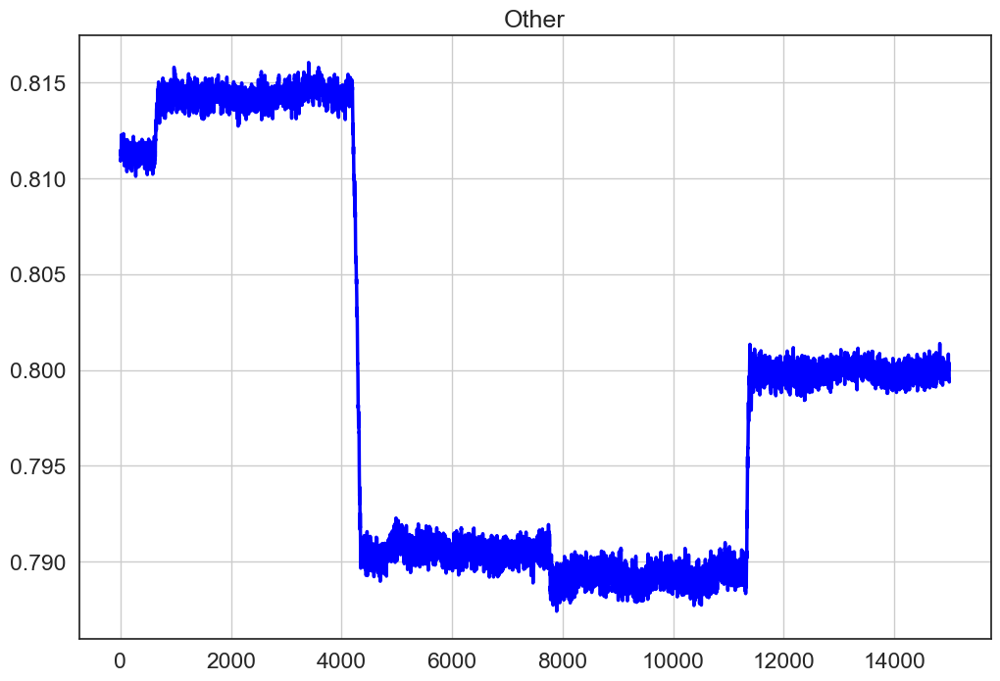

In [23]:
plt.figure(figsize=(12, 8))  # Adjusting figure size for better clarity
sns.set_theme(context="notebook", style="white", font_scale=1.5)     # Adjust font scale for readability
sns.set_style("white")       # Use a clean style
plt.grid(visible=True)       # Enable grid

# Plot the first row of normal_train_data
plt.plot(np.arange(15000), normal_train_data[0], color='blue', linewidth=2.5)  # Updated range to 15000
plt.title("Other", fontsize=18)  # Updated title


# Show the plot
plt.show()

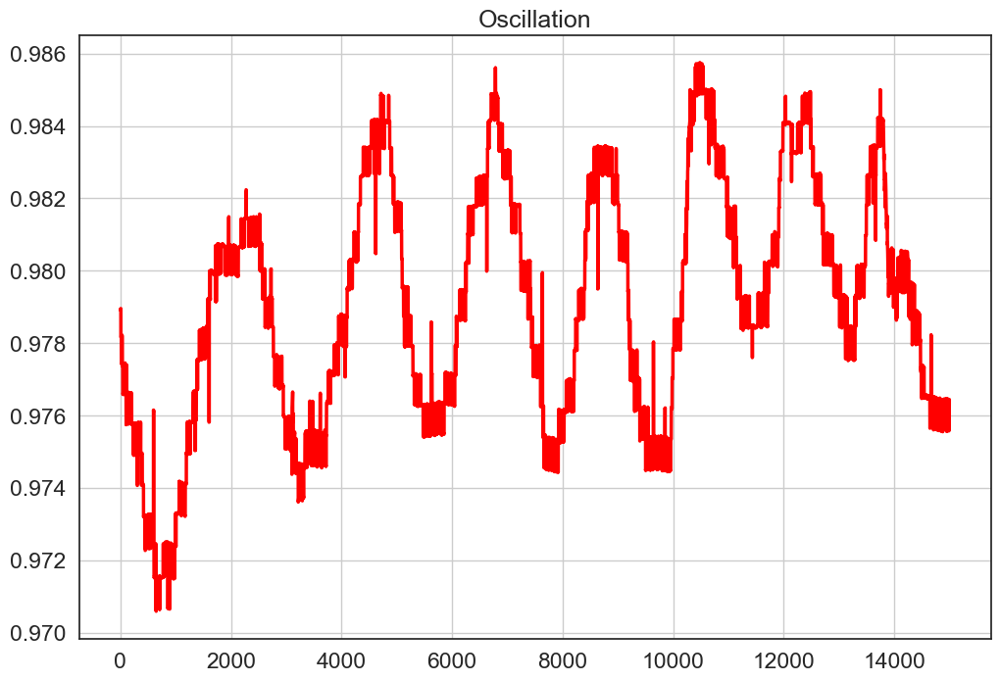

In [24]:
plt.figure(figsize=(12, 8))  # Adjusting figure size for better clarity
sns.set_theme(context="notebook", style="white", font_scale=1.5)    # Adjust font scale for readability
sns.set_style("white")       # Use a clean style
plt.grid(visible=True)       # Enable grid

plt.plot(np.arange(15000), anomalous_train_data[0], color='red', linewidth=2.5)
plt.title("Oscillation", fontsize=18)


# Show the plot
plt.show()

In [25]:
import tensorflow as tf
from tensorflow.keras import layers, Model

class AnomalyDetector(Model):
    def __init__(self):
        super(AnomalyDetector, self).__init__()
        
        # Encoder: Specify the input shape explicitly
        self.encoder = tf.keras.Sequential([
            layers.Input(shape=(15000,)),  # Updated input shape
            layers.Dense(256, activation="relu"),
            layers.Dense(128, activation="relu"),
            layers.Dense(64, activation="relu"),
            layers.Dense(32, activation="relu")
        ])
        
        # Decoder: Matches the output of encoder and reconstructs the original shape
        self.decoder = tf.keras.Sequential([
            layers.Input(shape=(32,)),  # Input shape is the output size of the encoder
            layers.Dense(64, activation="relu"),
            layers.Dense(128, activation="relu"),
            layers.Dense(256, activation="relu"),
            layers.Dense(15000, activation="sigmoid")  # Updated output shape to match input data
        ])
    
    def call(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

# Instantiate the autoencoder model
autoencoder = AnomalyDetector()
autoencoder.compile(optimizer='adam', loss='mae')

# Print the model summary
autoencoder.build(input_shape=(None, 15000))  # Define the input shape to fully build the model
print(autoencoder.summary())

Model: "anomaly_detector"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (None, 32)             │     3,883,488 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_1 (Sequential)       │ (None, 15000)          │     3,898,456 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,781,944 (29.69 MB)

 Trainable params: 7,781,944 (29.69 MB)

 Non-trainable params: 0 (0.00 B)

None


In [26]:
# # Re-split and reshape
# from sklearn.model_selection import train_test_split

# # Assuming `data` is the full dataset
# X_train, X_test = train_test_split(data, test_size=0.2, random_state=42)

# # # Check if the new splits work with reshaping
# # X_train = X_train.reshape(-1, 1500)
# # X_test = X_test.reshape(-1, 1500)

In [27]:
input_shape = train_data.shape[1]  # Number of features
autoencoder.encoder.layers[0] = layers.Input(shape=(input_shape,))
autoencoder.decoder.layers[-1] = layers.Dense(input_shape, activation="sigmoid")
reconstructed = autoencoder.predict(train_data)
# print("train_data shape:", X_train.shape)
# print("test_data shape:", X_test.shape)

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step  


In [28]:
# print("train_data shape:", X_train.shape)
# print("test_data shape:", X_test.shape)

# # If there are adjustments applied to test_data
# print("test_data shape after adjustment:", X_test.shape)
# print("Reconstructed shape:", reconstructed.shape)


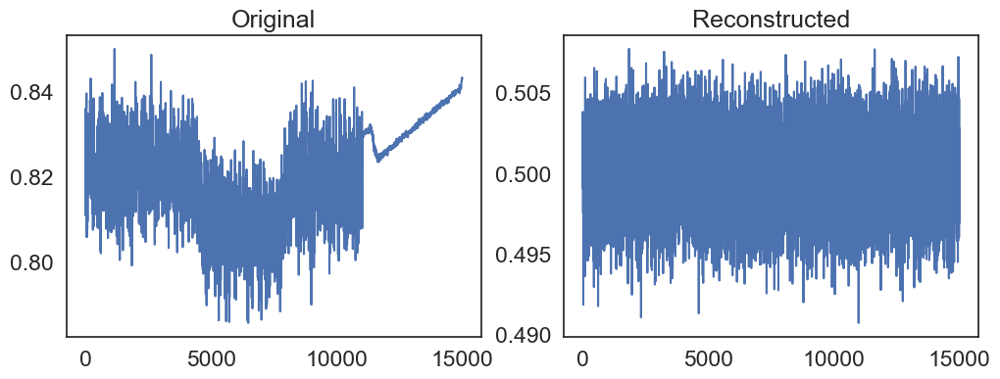

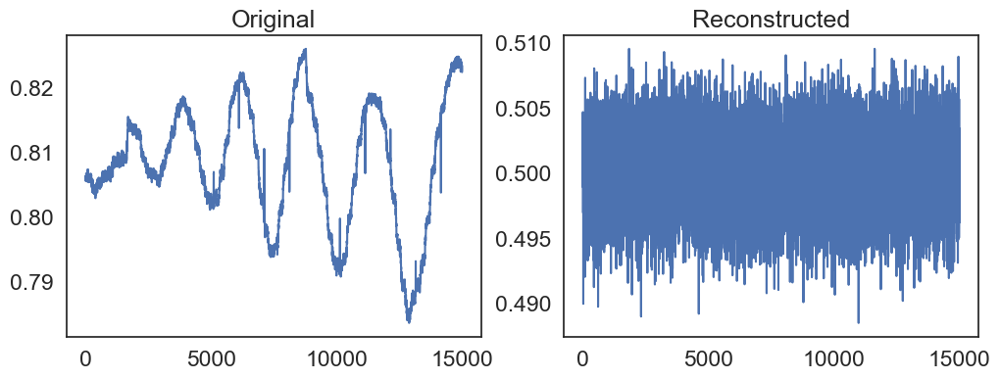

In [29]:
# Plot original and reconstructed for comparison
for i in range(2):  # Display 5 examples
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.title("Original")
    plt.plot(test_data[i])
    plt.subplot(1, 2, 2)
    plt.title("Reconstructed")
    plt.plot(reconstructed[i])
    plt.show()

In [30]:
history = autoencoder.fit(
    train_data, train_data,  # Input and target are the same for autoencoders
    epochs=200,
    batch_size=64,
    validation_data=(test_data, test_data),
    # validation_split=0.2,
    shuffle=True
)

Epoch 1/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.4189 - val_loss: 0.3575
Epoch 2/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.3452 - val_loss: 0.1217
Epoch 3/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1141 - val_loss: 0.0928
Epoch 4/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0798 - val_loss: 0.0962
Epoch 5/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0810 - val_loss: 0.0962
Epoch 6/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0841 - val_loss: 0.0962
Epoch 7/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0854 - val_loss: 0.0962
Epoch 8/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0820 - val_loss: 0.0962
Epoch 9/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0830 - val_loss: 0.0962
Epoch 10/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0826 - val_loss: 0.0962
Epoch 11/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0811 - val_loss: 0.0962
Epoch 12/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0797 - val_lo

In [31]:
reconstructed = autoencoder.predict(test_data)
loss = tf.keras.losses.mae(test_data, reconstructed)
print("Reconstruction loss:", loss)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Reconstruction loss: tf.Tensor(
[0.17927897 0.19165385 0.01877755 0.07753777 0.01959078 0.01989949
 0.19092079 0.01836642 0.0193747  0.17676538 0.18753558 0.01945237
 0.18382765 0.0166789  0.22910492 0.11407201 0.01977582 0.06530248
 0.19817005 0.02449631 0.01860628 0.02101329 0.10863965 0.1909867 ], shape=(24,), dtype=float32)


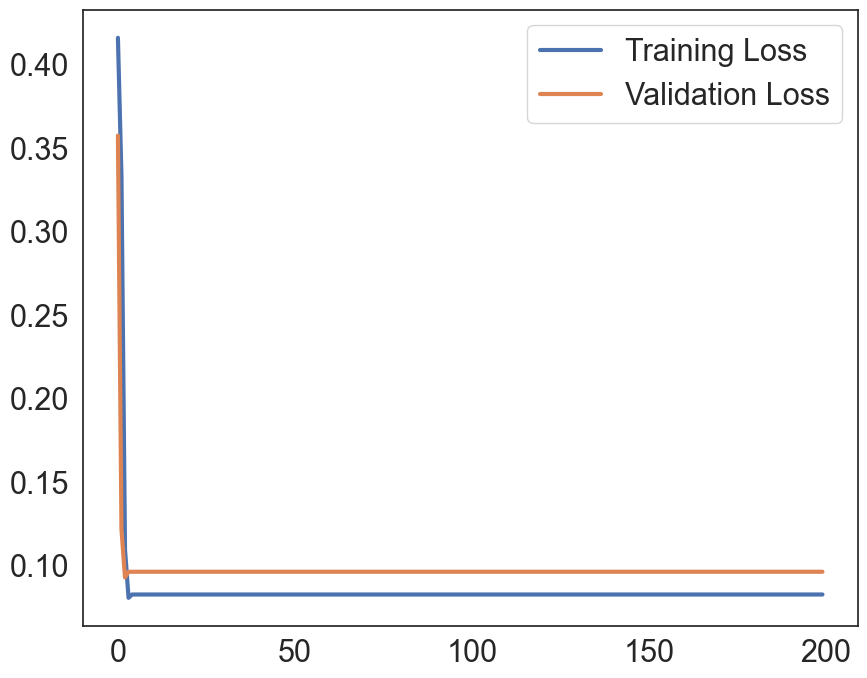

In [32]:
plt.figure(figsize=(10,8))
sns.set(font_scale = 2)
sns.set_style("white")
plt.plot(history.history["loss"], label="Training Loss",linewidth=3.0)
plt.plot(history.history["val_loss"], label="Validation Loss",linewidth=3.0)
plt.legend()

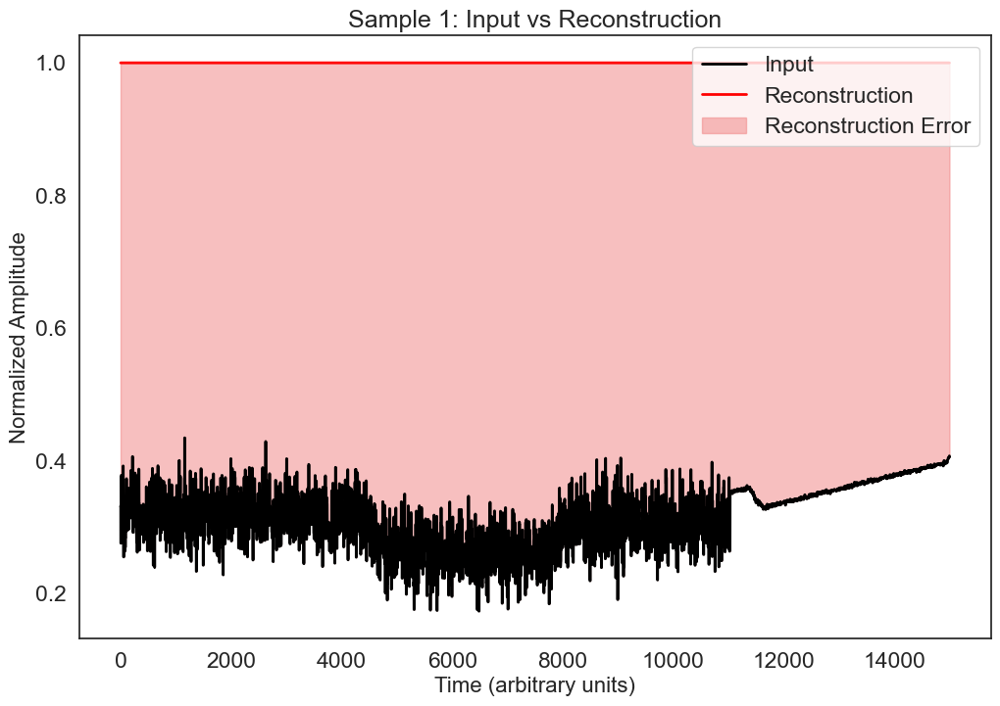

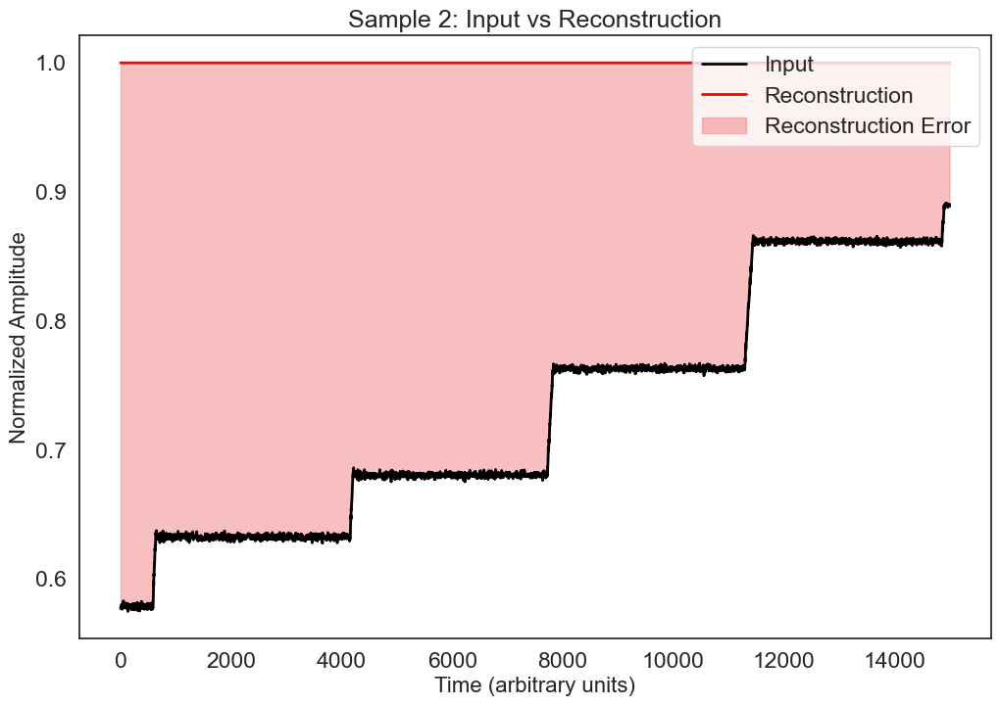

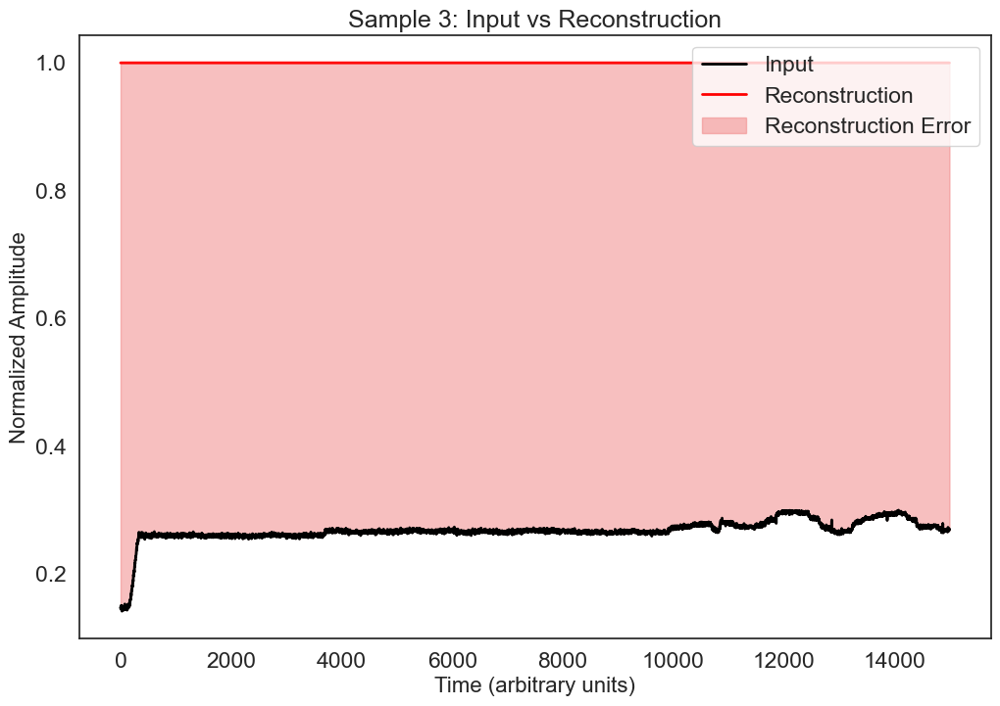

In [33]:
# Normalize input data (if not already done)
normal_test_data = (normal_test_data - np.min(normal_test_data)) / (np.max(normal_test_data) - np.min(normal_test_data))
# Encode and decode the test data
encoded_imgs = autoencoder.encoder(normal_test_data).numpy()
decoded_imgs = autoencoder.decoder(encoded_imgs).numpy()

# Visualize the original vs. reconstructed data for the first three samples
for i in range(3):  # Loop through the first 3 samples
    plt.figure(figsize=(12, 8))  # Adjust figure size for better clarity
    sns.set(font_scale=1.5)      # Adjust font scale
    sns.set_style("white")       # Use clean white style
    
    # Plot the original input data (black line)
    plt.plot(normal_test_data[i], color='black', linewidth=2, label="Input")
    
    # Plot the reconstructed data (red line)
    plt.plot(decoded_imgs[i], color='red', linewidth=2, label="Reconstruction")
    
    # Highlight the reconstruction error with a fill between
    plt.fill_between(
        np.arange(15000),  # Updated to match the length of your features
        decoded_imgs[i], 
        normal_test_data[i], 
        color='lightcoral', 
        alpha=0.5, 
        label="Reconstruction Error"
    )
    
    # Add legend and labels
    plt.legend(loc="upper right")
    plt.title(f"Sample {i + 1}: Input vs Reconstruction", fontsize=18)
    plt.xlabel("Time (arbitrary units)", fontsize=16)
    plt.ylabel("Normalized Amplitude", fontsize=16)
    
    # Show the plot
    plt.show()


In [34]:
encoded_imgs_normal = pd.DataFrame(encoded_imgs)
encoded_imgs_normal['label'] = 1

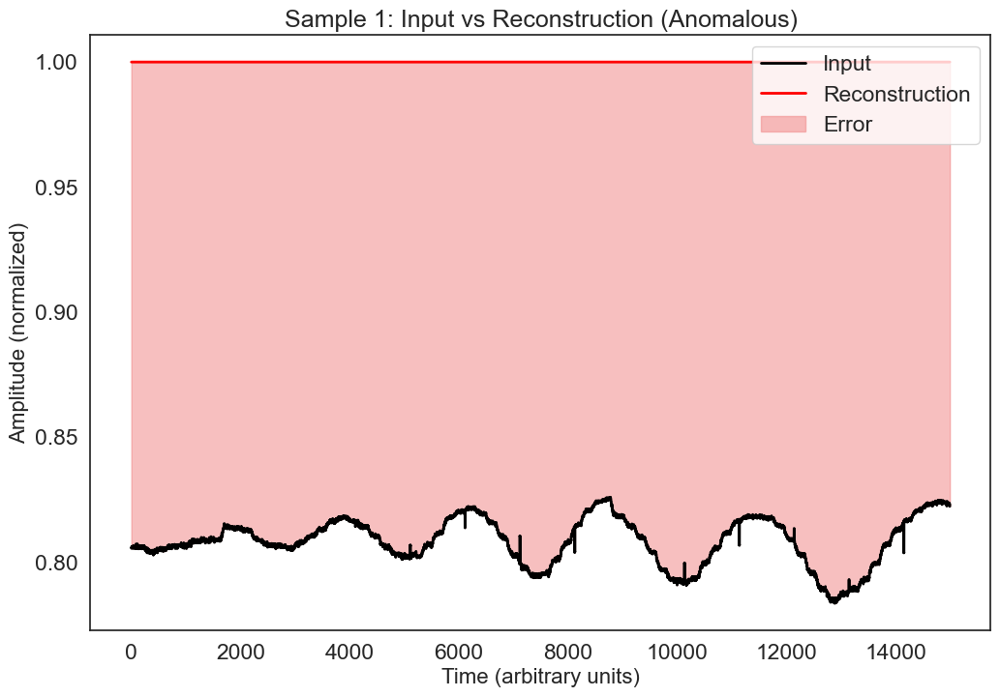

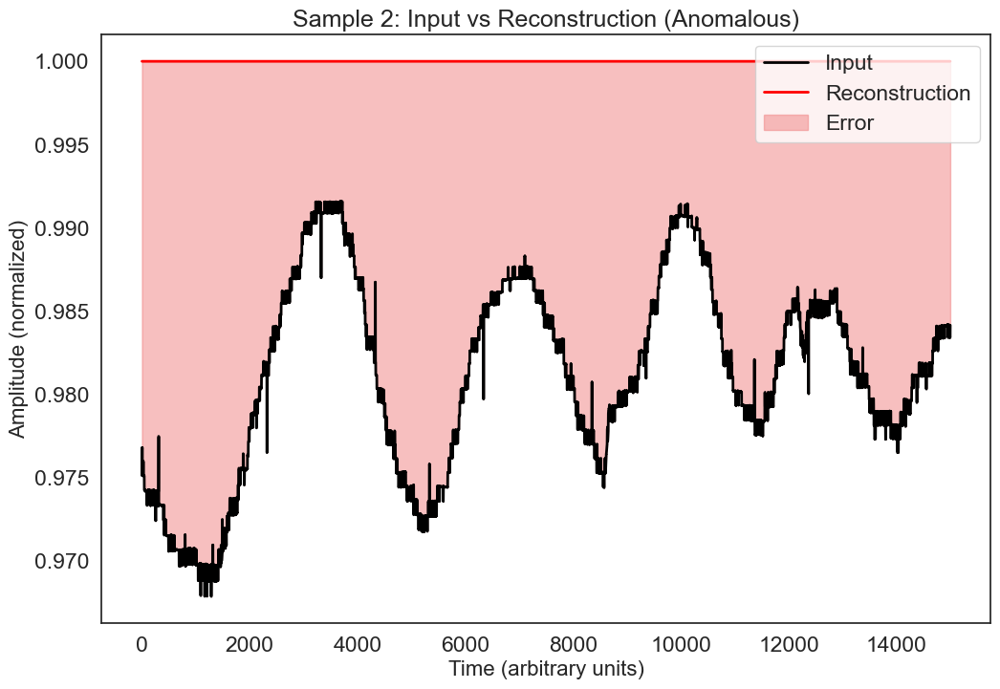

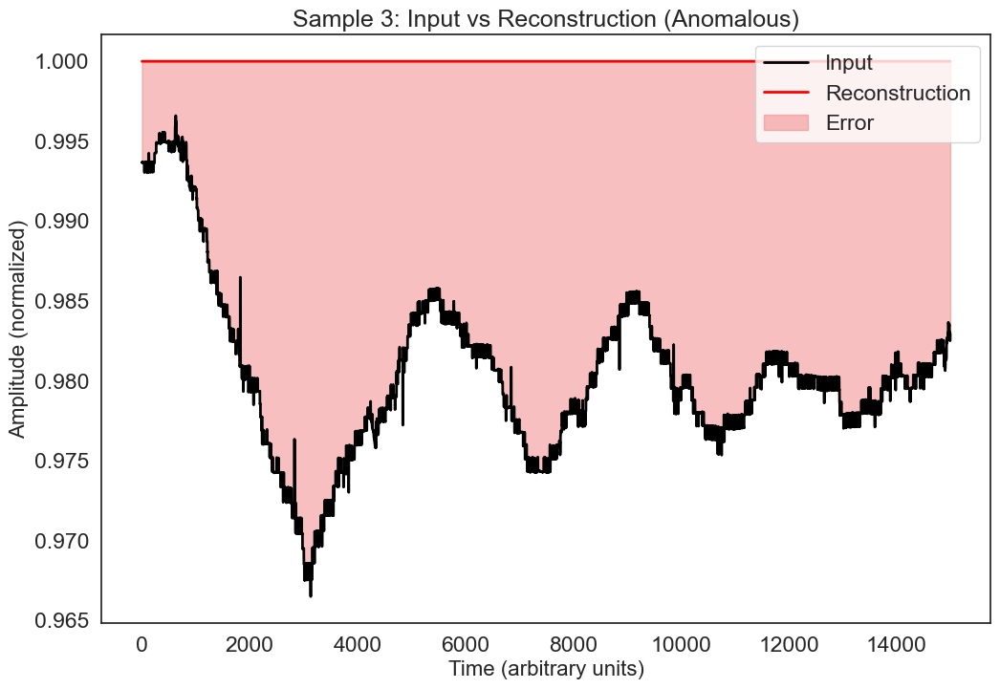

In [35]:
# Encode and decode the anomalous test data
encoded_imgs = autoencoder.encoder(anomalous_test_data).numpy()
decoded_imgs = autoencoder.decoder(encoded_imgs).numpy()

# Visualize the original vs. reconstructed data for the first three anomalous samples
for i in range(3):  # Loop through the first 3 samples
    plt.figure(figsize=(12, 8))  # Adjust figure size for better clarity
    sns.set(font_scale=1.5)      # Adjust font scale
    sns.set_style("white")       # Use clean white style
    
    # Plot the original anomalous input data (black line)
    plt.plot(anomalous_test_data[i], color='black', linewidth=2, label="Input")
    
    # Plot the reconstructed data (red line)
    plt.plot(decoded_imgs[i], color='red', linewidth=2, label="Reconstruction")
    
    # Highlight the reconstruction error with a fill between
    plt.fill_between(
        np.arange(15000),  # Updated to match the length of your features
        decoded_imgs[i], 
        anomalous_test_data[i], 
        color='lightcoral', 
        alpha=0.5, 
        label="Error"
    )
    
    # Add legend and labels
    plt.legend(loc="upper right")
    plt.title(f"Sample {i + 1}: Input vs Reconstruction (Anomalous)", fontsize=18)
    plt.xlabel("Time (arbitrary units)", fontsize=16)
    plt.ylabel("Amplitude (normalized)", fontsize=16)
    
    # Show the plot
    plt.show()


In [36]:
encoded_imgs_abnormal = pd.DataFrame(encoded_imgs)
encoded_imgs_abnormal['label'] = 0

In [37]:
all_encoded = pd.concat([encoded_imgs_normal,encoded_imgs_abnormal])

/Users/humayrajeba/Library/Python/3.9/lib/python/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


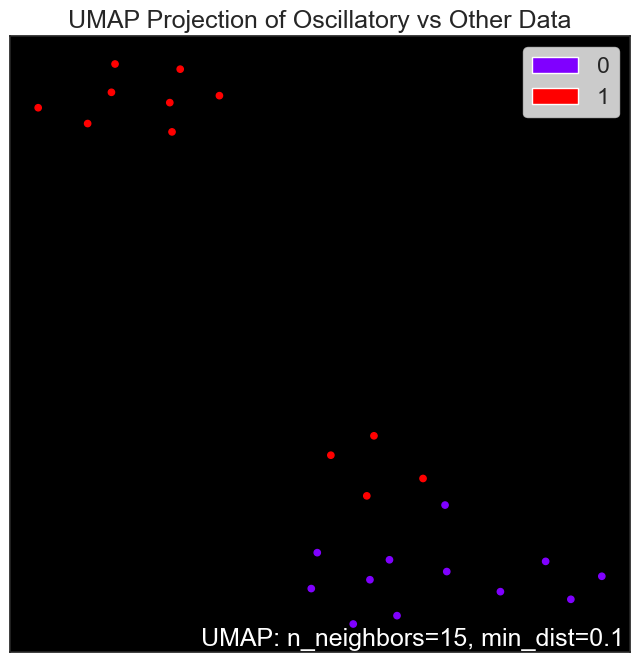

In [38]:
# Assuming `all_encoded` contains 1500 features + 1 label column (at index 1500)
# Prepare the data
feature_columns = all_encoded.iloc[:, :-1]  # All columns except the last one (features)
label_column = all_encoded.iloc[:, -1]      # The last column (labels)

# Fit UMAP to the feature columns
mapper = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42).fit(feature_columns)

# Plot the UMAP results with labels
umap.plot.points(mapper, labels=label_column, theme='fire')

# Add a title and show the plot
plt.title("UMAP Projection of Oscillatory vs Other Data")
plt.show()

In [39]:
reconstructions = autoencoder.predict(normal_train_data)
train_loss = tf.keras.losses.mae(reconstructions, normal_train_data)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


In [40]:
np.mean(train_loss)

0.12706292

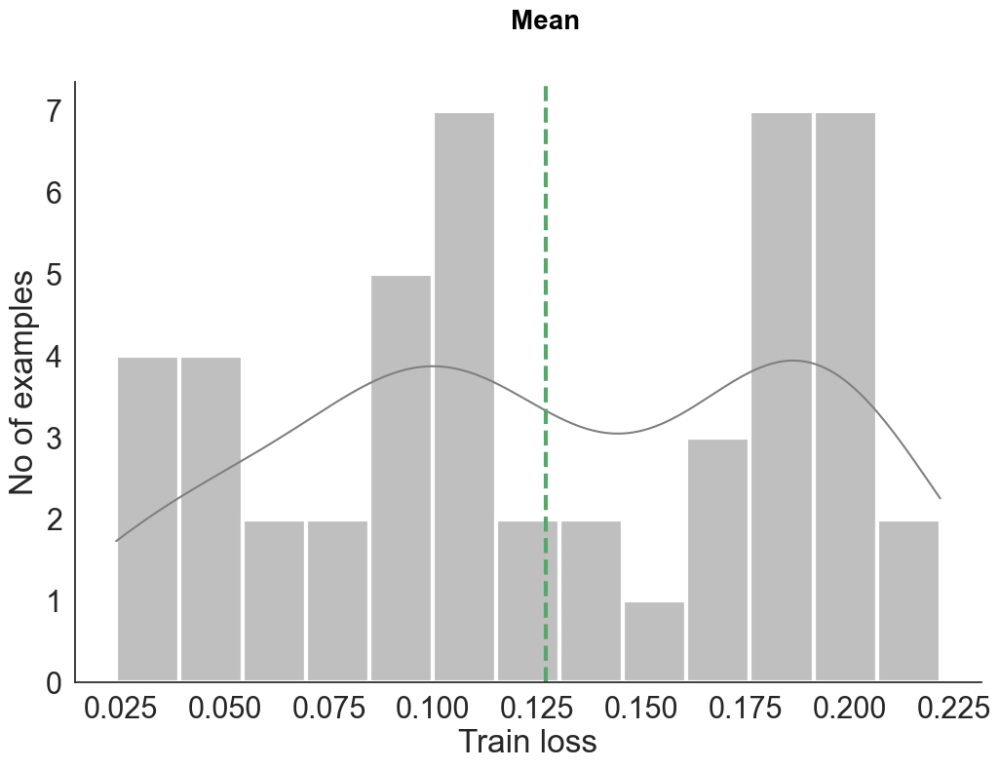

In [41]:
plt.figure(figsize=(12,8))
sns.set(font_scale = 2)
sns.set_style("white")
sns.histplot(train_loss ,bins=13,kde=True,color='grey',linewidth=3)
plt.axvline(x=np.mean(train_loss), color='g', linestyle='--', linewidth=3)
plt.text(np.mean(train_loss), 8, "Mean", horizontalalignment='center', 
         size='small', color='black', weight='semibold')
plt.xlabel("Train loss")
plt.ylabel("No of examples")
sns.despine()

In [42]:
threshold = np.mean(train_loss) + np.std(train_loss)
print("Threshold: ", threshold)

Threshold:  0.1861211


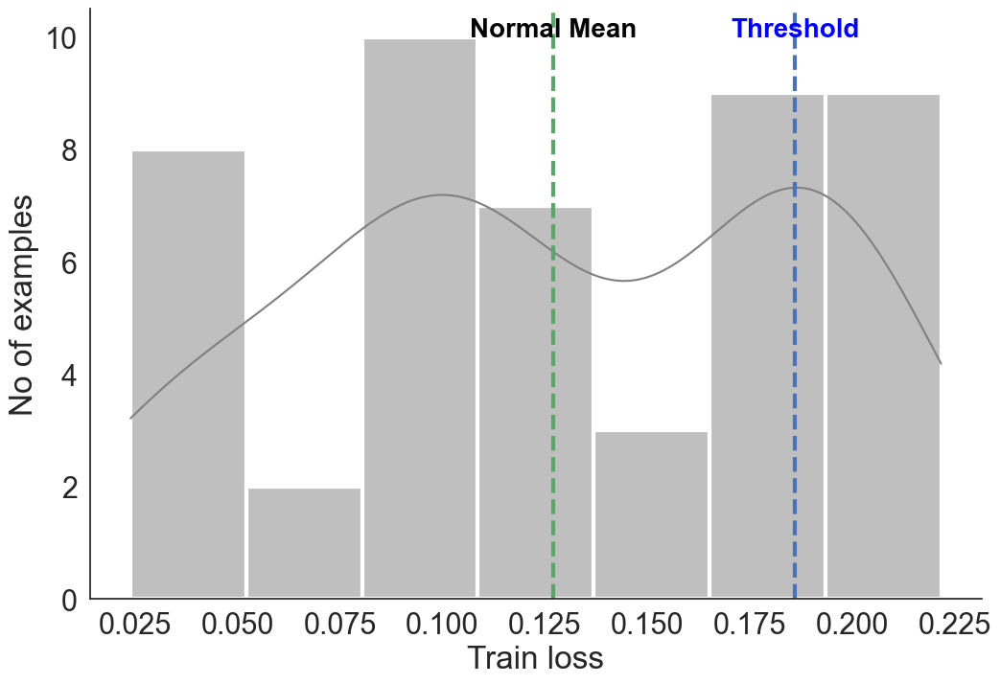

In [43]:
plt.figure(figsize=(12,8))
sns.set(font_scale = 2)
sns.set_style("white")
sns.histplot(train_loss ,bins=7,kde=True,color='grey',linewidth=3)
plt.axvline(x=np.mean(train_loss), color='g', linestyle='--', linewidth=3)
plt.text(np.mean(train_loss), 10, "Normal Mean", horizontalalignment='center', 
         size='small', color='black', weight='semibold')
plt.axvline(x=threshold, color='b', linestyle='--', linewidth=3)
plt.text(threshold, 10, "Threshold", horizontalalignment='center', 
         size='small', color='Blue', weight='semibold')
plt.xlabel("Train loss")
plt.ylabel("No of examples")
sns.despine()

In [44]:
reconstructions = autoencoder.predict(anomalous_test_data)
test_loss = tf.keras.losses.mae(reconstructions, anomalous_test_data)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


In [45]:
np.mean(test_loss)

0.033973817

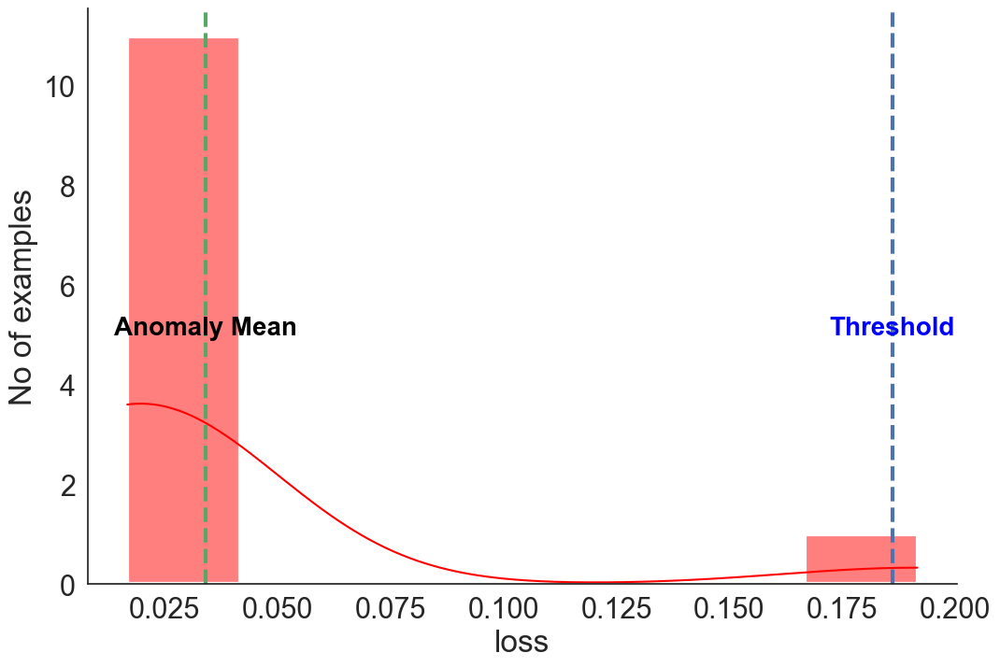

In [46]:
plt.figure(figsize=(12,8))
sns.set(font_scale = 2)
sns.set_style("white")
sns.histplot(test_loss ,bins=7,kde=True,color='red',linewidth=3)
plt.axvline(x=np.mean(test_loss), color='g', linestyle='--', linewidth=3)
plt.text(np.mean(test_loss), 5, "Anomaly Mean", horizontalalignment='center', 
         size='small', color='black', weight='semibold')
plt.text(threshold, 5, "Threshold", horizontalalignment='center', 
         size='small', color='Blue', weight='semibold')
plt.axvline(x=threshold, color='b', linestyle='--', linewidth=3)
plt.xlabel("loss")
plt.ylabel("No of examples")
sns.despine()

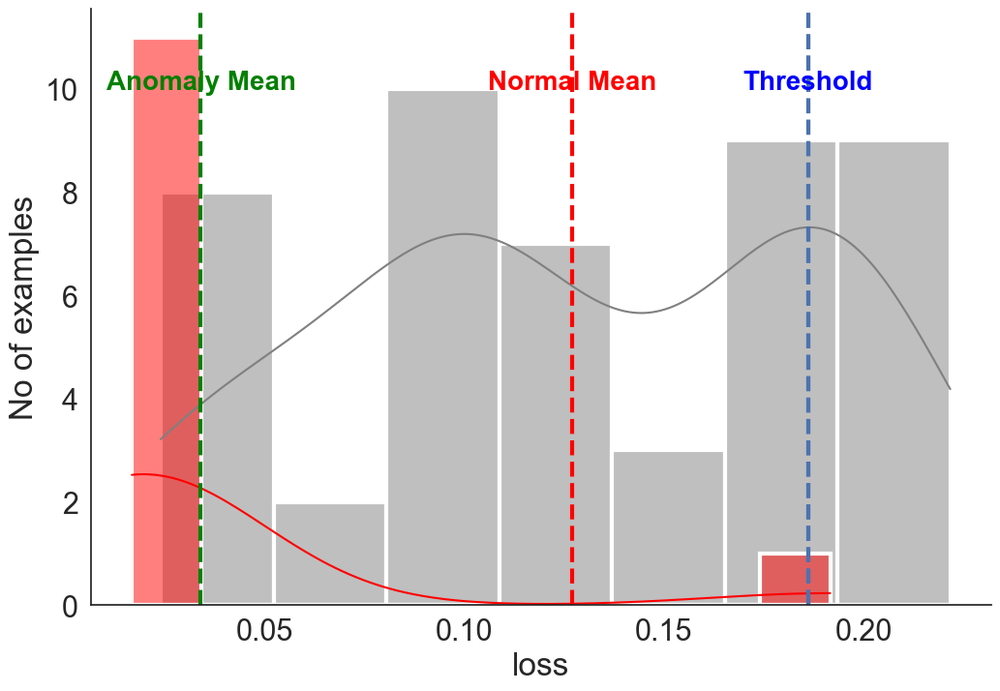

In [47]:
plt.figure(figsize=(12,8))
sns.set(font_scale = 2)
sns.set_style("white")
sns.histplot(train_loss ,bins=7,kde=True,color='grey',linewidth=3)
plt.axvline(x=np.mean(train_loss), color='red', linestyle='--', linewidth=3)
plt.text(np.mean(train_loss), 10, "Normal Mean", horizontalalignment='center', 
         size='small', color='red', weight='semibold')
plt.axvline(x=threshold, color='b', linestyle='--', linewidth=3)
plt.text(threshold, 10, "Threshold", horizontalalignment='center', 
         size='small', color='Blue', weight='semibold')

sns.histplot(test_loss ,bins=10,kde=True,color='red',linewidth=3)
plt.axvline(x=np.mean(test_loss), color='green', linestyle='--', linewidth=3)
plt.text(np.mean(test_loss), 10, "Anomaly Mean", horizontalalignment='center', 
         size='small', color='green', weight='semibold')
plt.axvline(x=threshold, color='b', linestyle='--', linewidth=3)
plt.xlabel("loss")
plt.ylabel("No of examples")
sns.despine()

In [48]:
def predict(model, data, threshold):
  reconstructions = model(data)
  loss = tf.keras.losses.mae(reconstructions, data)
  return tf.math.less(loss, threshold)
   

# Predictions for test set
preds = predict(autoencoder, test_data, threshold)
# Evaluate model
def print_stats(predictions, labels):
    preds = predictions.numpy() if hasattr(predictions, 'numpy') else predictions
    print("Accuracy:", accuracy_score(labels, preds))
    print("Precision:", precision_score(labels, preds))
    print("Recall:", recall_score(labels, preds))
    print("F1 Score:", f1_score(labels, preds))

print_stats(preds, test_labels)

Accuracy: 0.6666666666666666
Precision: 0.6111111111111112
Recall: 0.9166666666666666
F1 Score: 0.7333333333333333


<Axes: >

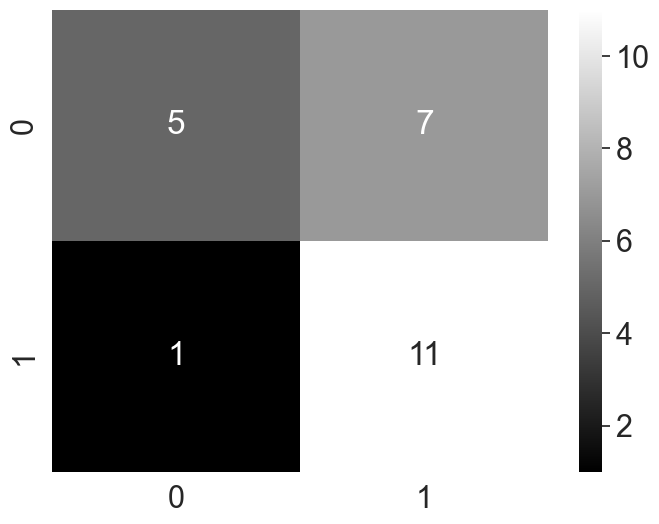

In [49]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, f1_score

def get_clf_eval(y_test, pred=None, pred_proba=None):
    confusion = confusion_matrix(y_test, pred)  # Confusion matrix
    accuracy = accuracy_score(y_test, pred)  # Accuracy score
    precision = precision_score(y_test, pred)  # Precision score
    f1 = f1_score(y_test, pred)  # F1 score

    return confusion, accuracy, precision, f1  # Return confusion matrix and all metrics

# Assuming test_labels and preds are defined
confusion_matrix_result, accuracy, precision, f1 = get_clf_eval(test_labels, preds)

# # Print the metrics
# print(f"Accuracy: {accuracy}")
# print(f"Precision: {precision}")
# print(f"F1 Score: {f1}")

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.set(font_scale=2)
sns.set_style("white")
sns.heatmap(confusion_matrix_result, cmap='gist_yarg_r', annot=True, fmt='d')


In [50]:
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier  # Example model

model = RandomForestClassifier(random_state=21)
scores = cross_val_score(model, data, labels, cv=5, scoring='accuracy')
print("Cross-validation Accuracy:", scores.mean())
scores = cross_val_score(model, data, labels, cv=5, scoring='f1')
print(f"Cross-validation Mean F1 Score: {scores.mean()}")


Cross-validation Accuracy: 0.8916666666666666
Cross-validation Mean F1 Score: 0.8925217391304348


In [52]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import accuracy_score, mean_squared_error

# Define the Random Forest model
model = RandomForestRegressor(n_estimators=100, random_state=0)

# Train the model on the training data
model.fit(train_data, train_labels)

# Predict on the test data
predicted = model.predict(test_data)

# Calculate accuracy (classification-like for regression with rounded predictions)
accuracy = accuracy_score(test_labels, predicted.round()) * 100

# Print results
print("The accuracy of Random Forest is:", accuracy, "%")
print("Mean Squared Error (MSE):", mean_squared_error(test_labels, predicted))


The accuracy of Random Forest is: 95.83333333333334 %
Mean Squared Error (MSE): 0.05836666666666666


In [55]:
# Corrected imports
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier  # Fixed import
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score

# No need to call .numpy() since data is already a NumPy array
X_train, X_test = train_data, test_data  

# Convert boolean labels (True/False) to integers (0/1)
y_train, y_test = train_labels.astype(int), test_labels.astype(int)

# Store results
results = {}

# Random Forest
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)
rf_preds = rf_model.predict(X_test)
results["Random Forest"] = accuracy_score(y_test, rf_preds)

# Decision Tree
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train, y_train)
dt_preds = dt_model.predict(X_test)
results["Decision Tree"] = accuracy_score(y_test, dt_preds)

# XGBoost
xgb_model = XGBClassifier(random_state=42, eval_metric='logloss')
xgb_model.fit(X_train, y_train)
xgb_preds = xgb_model.predict(X_test)
results["XGBoost"] = accuracy_score(y_test, xgb_preds)

# Print results
for model, acc in results.items():
    print(f"{model} Accuracy: {acc:.4f}")


Random Forest Accuracy: 0.9583
Decision Tree Accuracy: 0.7500
XGBoost Accuracy: 0.9583


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step

### Accuracy ###
Random Forest: 0.9583
Decision Tree: 0.9167
XGBoost: 0.9583
Autoencoder: 0.7917


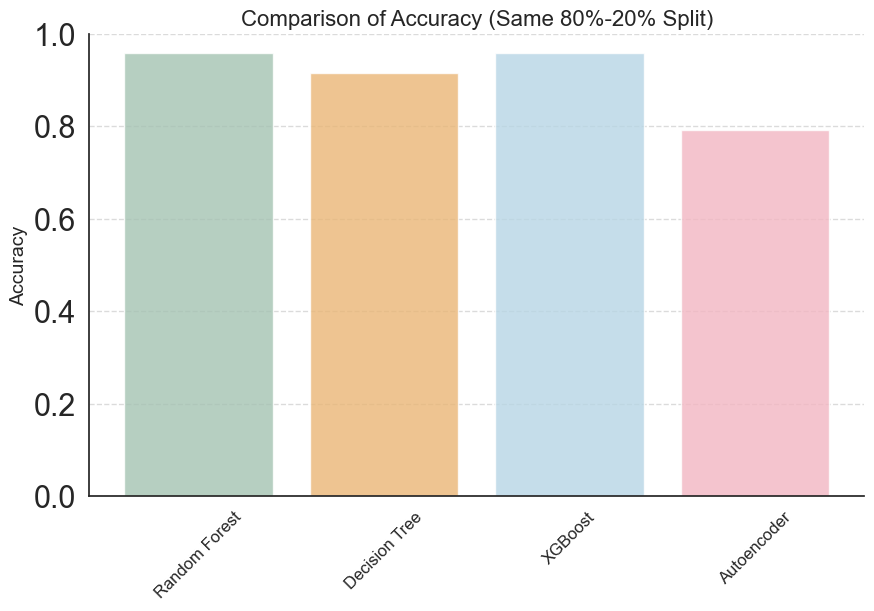


### Precision ###
Random Forest: 1.0000
Decision Tree: 1.0000
XGBoost: 1.0000
Autoencoder: 0.7333


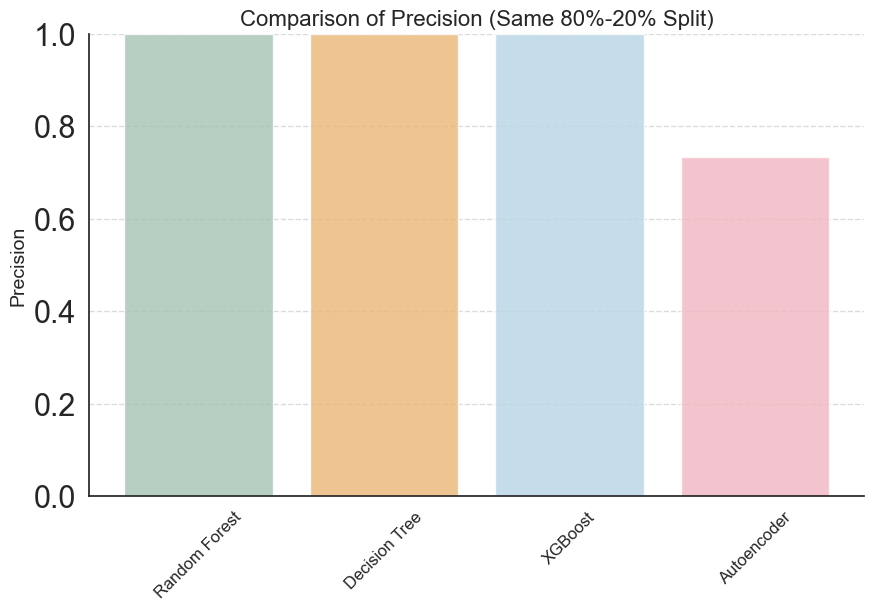


### Recall ###
Random Forest: 0.9167
Decision Tree: 0.8333
XGBoost: 0.9167
Autoencoder: 0.9167


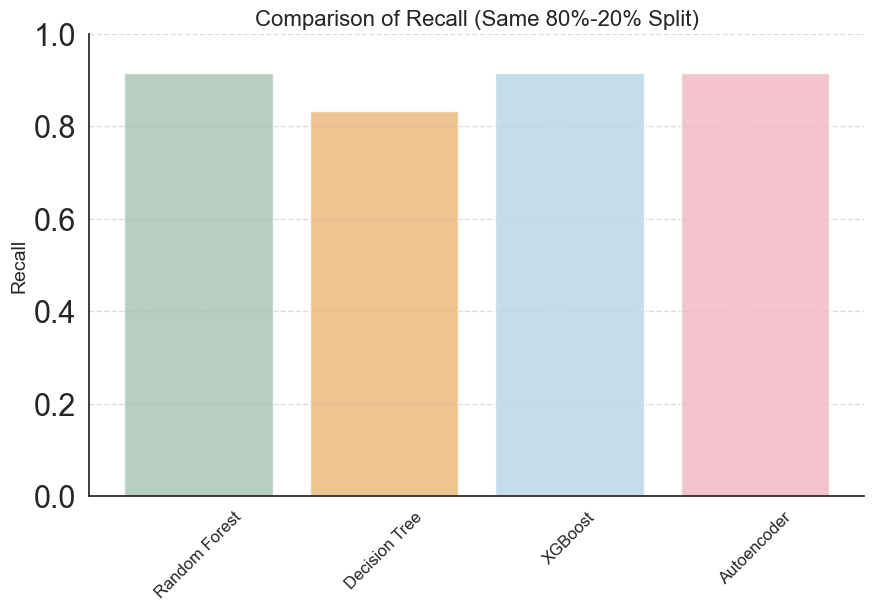


### F1 ###
Random Forest: 0.9565
Decision Tree: 0.9091
XGBoost: 0.9565
Autoencoder: 0.8148


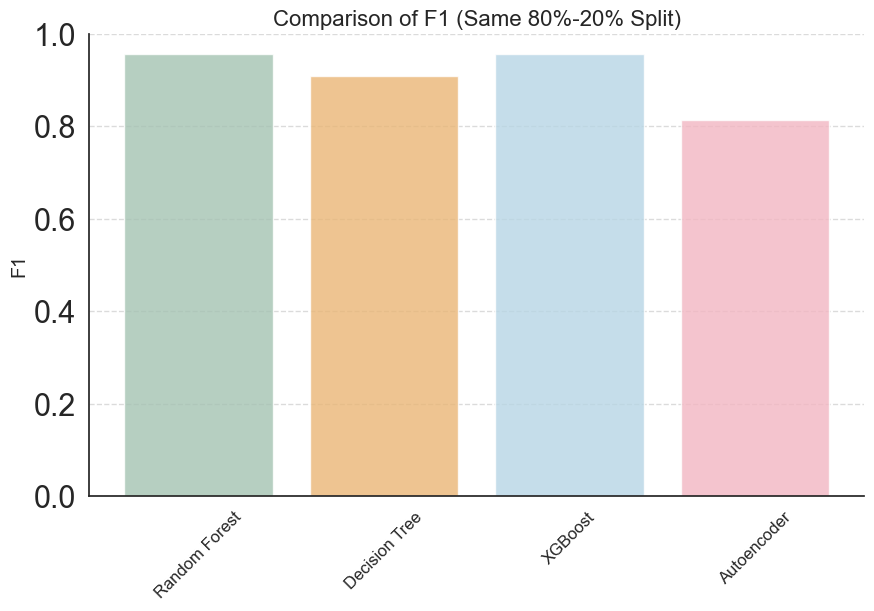

In [56]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier

#  Use the same train-test split as Autoencoder
X_train, X_test = train_data, test_data
y_train, y_test = train_labels.astype(int), test_labels.astype(int)

#  Placeholder for storing metrics
results = {
    "Random Forest": {},
    "Decision Tree": {},
    "XGBoost": {},
    "Autoencoder": {}
}

#  Random Forest (with constraints to reduce overfitting)
rf_model = RandomForestClassifier(
    random_state=42, 
    max_depth=5,               # Prevents trees from growing too deep
    min_samples_split=10,      # Requires at least 10 samples to split a node
    min_samples_leaf=5,        # Ensures each leaf has at least 5 samples
    n_estimators=100           # Number of trees
)
rf_model.fit(X_train, y_train)
rf_preds = rf_model.predict(X_test)
results["Random Forest"] = {
    "accuracy": accuracy_score(y_test, rf_preds),
    "precision": precision_score(y_test, rf_preds),
    "recall": recall_score(y_test, rf_preds),
    "f1": f1_score(y_test, rf_preds),
}

#  Decision Tree (with constraints)
dt_model = DecisionTreeClassifier(
    random_state=42,
    max_depth=5,               # Prevents trees from memorizing exact samples
    min_samples_split=10       # Ensures splits occur only when necessary
)
dt_model.fit(X_train, y_train)
dt_preds = dt_model.predict(X_test)
results["Decision Tree"] = {
    "accuracy": accuracy_score(y_test, dt_preds),
    "precision": precision_score(y_test, dt_preds),
    "recall": recall_score(y_test, dt_preds),
    "f1": f1_score(y_test, dt_preds),
}

#  XGBoost (with constraints)
xgb_model = XGBClassifier(
    random_state=42, 
    eval_metric='logloss',  
    max_depth=5,            # Limits depth of each tree
    learning_rate=0.1,      # Helps prevent overfitting
    n_estimators=100        # Number of trees
)
xgb_model.fit(X_train, y_train)
xgb_preds = xgb_model.predict(X_test)
results["XGBoost"] = {
    "accuracy": accuracy_score(y_test, xgb_preds),
    "precision": precision_score(y_test, xgb_preds),
    "recall": recall_score(y_test, xgb_preds),
    "f1": f1_score(y_test, xgb_preds),
}

# Autoencoder (uses same test data for fair comparison)
reconstructed = autoencoder.predict(X_test)
loss = tf.keras.losses.mae(X_test, reconstructed).numpy()
threshold = np.mean(loss) + np.std(loss)
preds = (loss < threshold)  # Classify based on threshold

# Store Autoencoder metrics
results["Autoencoder"] = {
    "accuracy": accuracy_score(y_test, preds),
    "precision": precision_score(y_test, preds),
    "recall": recall_score(y_test, preds),
    "f1": f1_score(y_test, preds),
}

#  Plot Results
metrics = ["accuracy", "precision", "recall", "f1"]

# Define colors for the models
colors = {
    "Random Forest": "#A4C3B2",
    "Decision Tree": "#EAB676",
    "XGBoost": "#B7D5E5",
    "Autoencoder": "#F2B6C2",
}

for metric in metrics:
    print(f"\n### {metric.capitalize()} ###")
    
    # Print metric values for each model
    for model in results.keys():
        print(f"{model}: {results[model][metric]:.4f}")
    
    #  Plot the metric comparison
    plt.figure(figsize=(10, 6))
    
    # Get values for all models
    models = list(results.keys())
    values = [results[model][metric] for model in models]
    
    # Bar plot
    plt.bar(models, values, color=[colors[model] for model in models], alpha=0.8)
    
    # Formatting the plot
    plt.ylabel(metric.capitalize(), fontsize=14)
    plt.title(f"Comparison of {metric.capitalize()} (Same 80%-20% Split)", fontsize=16)
    plt.xticks(rotation=45, fontsize=12)
    plt.ylim(0, 1)  # All metrics are in the range [0, 1]
    plt.grid(axis="y", linestyle="--", alpha=0.7)
    sns.despine()  # Remove top and right spines
    
    plt.show()
